In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import os.path as osp
import json
from functools import partial
os.chdir('/home/gangus/cow-tus')

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
matplotlib.rcParams['animation.embed_limit'] = 2**128
plt.rc('figure', figsize=[5, 5])
plt.rc('animation', html='jshtml')

import cv2
import numpy as np
import torch
import torch.nn as nn
import emmental
from emmental import Meta
from emmental.data import EmmentalDataLoader
from emmental.model import EmmentalModel
from emmental.learner import EmmentalLearner
from emmental.scorer import Scorer
from emmental.task import EmmentalTask
from tqdm import tqdm

from cow_tus.util.util import unpickle, ce_loss, output
from cow_tus.models.modules import zoo as modules
from cow_tus.data import datasets as all_datasets

In [3]:
exp_dirs = {
    'baseline': 'experiments/Q3-pres/instance-level-learning/ST-2normal_binary/full_size/no_augmentation/all_data/3'
}
exp_configs = {}
for exp_name, exp_dir in exp_dirs.items():
    with open(osp.join(exp_dir, 'config.json'), 'r') as f:
        exp_configs[exp_name] = json.load(f)

In [12]:
exp_dir = exp_dirs['baseline']
config = exp_configs['baseline']

emmental_dir = 'experiments/Q3-pres/instance-level-learning/ST-2normal_binary/full_size/no_augmentation/all_data/_emmental_logs/2019_11_22/08_42_57/1c8df63a'
emmental.init(osp.join(exp_dir, '_emmental_logs'))
Meta.update_config(
    config={
        'logging_config': {
            'checkpointer_config': {
                'checkpoint_path': emmental_dir
            }
        }
    }
)

encoder_class = config['encoder_class']
encoder_args = config['encoder_args']
task_to_label_dict = {
    '2normal_binary': '2normal_binary'
}

decoder_class = config['decoder_class']
decoder_args = config['decoder_args']

encoder_module = getattr(modules, encoder_class)(**encoder_args)
tasks = [
    EmmentalTask(
        name=task_name,
        module_pool=nn.ModuleDict(
            {
                f'encoder_module': encoder_module,
                f'decoder_module_{task_name}': getattr(modules, decoder_class)(2, **decoder_args),
            }
        ),
        task_flow=[
            {
                'name': 'encoder_module', 'module': 'encoder_module', 'inputs': [('_input_', 'clip')]
            },
            {
                'name':   f'decoder_module_{task_name}',
                'module': f'decoder_module_{task_name}',
                'inputs': [('encoder_module', 0)],
            },
        ],
        loss_func=partial(ce_loss, task_name),
        output_func=partial(output, task_name),
        scorer=Scorer(metrics=['accuracy', 'roc_auc', 'precision', 'recall', 'f1']),
    )
    for task_name in task_to_label_dict.keys()
]
model = EmmentalModel(name='cow-tus-model', tasks=tasks)
checkpoint = torch.load(osp.join(emmental_dir, 'checkpoint_12.0.pth'), map_location=torch.device("cpu"))
model.name = checkpoint["model"]["name"]
model.load_state_dict(checkpoint["model"]["module_pool"])

[2019-11-22 10:41:02,292][INFO] emmental.meta:110 - Logging was already initialized to use experiments/Q3-pres/instance-level-learning/ST-2normal_binary/full_size/no_augmentation/all_data/3/_emmental_logs/2019_11_22/10_39_13/731666a0.  To configure logging manually, call emmental.init_logging before initialiting Meta.
[2019-11-22 10:41:02,312][INFO] emmental.meta:60 - Loading Emmental default config from /home/gangus/cow-tus/.emmental/src/emmental/emmental-default-config.yaml.
[2019-11-22 10:41:02,314][INFO] emmental.meta:160 - Updating Emmental config from user provided config.
[2019-11-22 10:41:02,463][INFO] root:244 - Loading I3D weights from i3d/model_flow.pth
[2019-11-22 10:41:02,545][INFO] emmental.task:48 - Created task: 2normal_binary
[2019-11-22 10:41:02,547][INFO] emmental.model:70 - Moving model to GPU (cuda:0).
[2019-11-22 10:41:02,566][INFO] emmental.model:56 - Created emmental model cow-tus-model that contains task {'2normal_binary'}.
[2019-11-22 10:41:02,567][INFO] emmen

In [13]:
dataset_class = config['dataset_class']
dataset_args = config['dataset_args']
transform_fns = config['transform_fns']

datasets = {}
for split in ['train', 'valid']:
    datasets[split] = getattr(all_datasets, dataset_class)(
        split_str=split,
        transform_fns=transform_fns[split],
        **dataset_args
    )
    
dataloader_configs = config['dataloader_configs']
dataloaders = []
for split in ['train', 'valid']:
    dataloaders.append(
        EmmentalDataLoader(
            task_to_label_dict=task_to_label_dict,
            dataset=datasets[split],
            split=split,
            **dataloader_configs[split],
        )
    )

[2019-11-22 10:41:07,366][INFO] cow_tus.data.datasets:170 - using 414 of 439 loop_idxs
[2019-11-22 10:41:07,802][INFO] emmental.data:52 - Auto generate uids for dataset cow-tus-dataset under _uids_.
[2019-11-22 10:41:07,869][INFO] cow_tus.data.datasets:170 - using 227 of 234 loop_idxs
[2019-11-22 10:41:08,118][INFO] emmental.data:52 - Auto generate uids for dataset cow-tus-dataset under _uids_.


In [14]:
def normalize_img(img):
    """
    """
    img = img.astype(np.float32)
    img -= img.min() # ensure the minimal value is 0.0
    img /= img.max() # maximum value in image is now 1.0
#     img = np.uint8(img*255)
    return img


def overlay_saliency(img, saliency, resolution=None, alpha=0.5):
    """
    """
#     orig = normalize_img(img.copy())
    orig = plt.cm.bone(img.copy())
    
    saliency = plt.cm.jet(saliency)
    
    cv2.addWeighted(saliency, alpha, orig, 1 - alpha, 0, orig)
    return orig


def show_saliency_maps(saliency_maps, name, video=True, top_slices=0, resolution=None):
    """ The number of
    args:
        saliency_maps  (list of dicts)
    """
    saliency_map = saliency_maps[name]

    images_grad = saliency_map["scan_grad"].numpy()
    images = saliency_map["scan"].numpy()

    #saliency_tensor = images_grad.abs().max(dim=4, keepdim=False)[0]
    #saliency_tensor = (saliency_tensor / saliency_tensor.max())
    images_grad = images_grad.max(axis=4, keepdims=False)
    images_grad = images_grad - images_grad.min()
    images_grad /= images_grad.max()
    saliency_tensor = images_grad

    imgs = []
    for j in tqdm(range(images.shape[1])):
        image_tensor = images[0, j, :, :]
        image_tensor = np.tile(image_tensor, (1, 1, 4))
        image_tensor = normalize_img(image_tensor)        
        saliency = saliency_tensor[0, j, :, :]
        max_saliency = saliency.max()

        image_saliency = overlay_saliency(image_tensor[:, :, 0], saliency)

        image_tensor = plt.cm.bone(image_tensor[:, :, 0])
        saliency = plt.cm.jet(saliency)
#         print(image_tensor.shape)
#         print(saliency.shape)
#         print(image_saliency.shape)
        imgs.append((max_saliency, image_tensor, saliency, image_saliency))

    if video:
        return show_saliency_video(imgs, resolution)

    if top_slices > 0:
        for i, (max_saliency, image, saliency, image_saliency) in enumerate(sorted(imgs, reverse=True)):
            if i == num_slices:
                break
            full = np.concatenate([image, saliency, image_saliency], axis=1)
            plt.figure(figsize=(15,15))
            plt.imshow(full)
            plt.axis('off')
            plt.show()

def show_saliency_video(imgs, resolution=None):
    """Generates the Animation object for data visualization.
    We deviate from prior implementations of data visualization due
    to Jupyter notebook weirdness. We recommend placing the returned
    object in an indvidual cell so Jupyter automatically renders its
    output.
    Args:
        imgs    A list of numpy matrices representing the DICOMs.
    Returns:
        An ArtistAnimation object containing the DICOMs of interest.
    """
    fig = plt.figure(figsize=(12,4))
    frames = []

    for i, (max_saliency, image, saliency, image_saliency) in tqdm(enumerate(imgs)):
        title = plt.text(-5, -5, max_saliency, fontsize=7.5, wrap=True)
        full = np.concatenate([image, saliency, image_saliency], axis=1)
        if resolution:
            full_dims = full.shape
            full = cv2.resize(full, resolution)
        frame = plt.imshow(full)
        frames.append([frame, title])

    ani = animation.ArtistAnimation(
        fig,
        frames,
        interval=100,
        blit=True,
        repeat_delay=1000
    )
    fig.tight_layout()
    plt.show()
    return ani

[2019-11-22 10:42:33,638][INFO] emmental.logging.logging_manager:37 - Evaluating every 2 epoch.
[2019-11-22 10:42:33,639][INFO] emmental.logging.logging_manager:55 - No checkpointing.
[2019-11-22 10:42:33,642][INFO] emmental.learner:92 - Using optimizer Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0.0
)
[2019-11-22 10:42:33,645][INFO] emmental.learner:564 - Start learning...


{'primary': tensor([1]), 'primary_multiclass': tensor([1]), '2normal_binary': tensor([0])} [218]
{'primary': tensor([1]), 'primary_multiclass': tensor([2]), '2normal_binary': tensor([1])} [0]
[0.9971512  0.00284878] [1]
{'primary': tensor([1]), 'primary_multiclass': tensor([2]), '2normal_binary': tensor([1])} [193]
[9.994850e-01 5.149515e-04] [1]
{'primary': tensor([0]), 'primary_multiclass': tensor([0]), '2normal_binary': tensor([0])} [165]
{'primary': tensor([0]), 'primary_multiclass': tensor([0]), '2normal_binary': tensor([0])} [155]
{'primary': tensor([0]), 'primary_multiclass': tensor([0]), '2normal_binary': tensor([0])} [214]
{'primary': tensor([0]), 'primary_multiclass': tensor([0]), '2normal_binary': tensor([0])} [159]
{'primary': tensor([1]), 'primary_multiclass': tensor([3]), '2normal_binary': tensor([1])} [102]
[0.99870396 0.00129607] [1]


/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.


{'primary': tensor([1]), 'primary_multiclass': tensor([1]), '2normal_binary': tensor([0])} [32]
{'primary': tensor([0]), 'primary_multiclass': tensor([0]), '2normal_binary': tensor([0])} [59]
{'primary': tensor([1]), 'primary_multiclass': tensor([1]), '2normal_binary': tensor([0])} [134]
{'primary': tensor([1]), 'primary_multiclass': tensor([1]), '2normal_binary': tensor([0])} [30]
{'primary': tensor([1]), 'primary_multiclass': tensor([1]), '2normal_binary': tensor([0])} [136]
{'primary': tensor([1]), 'primary_multiclass': tensor([1]), '2normal_binary': tensor([0])} [49]
{'primary': tensor([1]), 'primary_multiclass': tensor([1]), '2normal_binary': tensor([0])} [37]
{'primary': tensor([0]), 'primary_multiclass': tensor([0]), '2normal_binary': tensor([0])} [208]
{'primary': tensor([1]), 'primary_multiclass': tensor([3]), '2normal_binary': tensor([1])} [114]
[0.8190478  0.18095218] [1]
{'primary': tensor([1]), 'primary_multiclass': tensor([3]), '2normal_binary': tensor([1])} [117]
[0.9410

/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.


{'primary': tensor([1]), 'primary_multiclass': tensor([3]), '2normal_binary': tensor([1])} [120]
[0.9941797  0.00582031] [1]
{'primary': tensor([1]), 'primary_multiclass': tensor([2]), '2normal_binary': tensor([1])} [195]
[0.15366876 0.8463313 ] [1]


/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
100%|██████████| 40/40 [00:00<00:00, 143.22it/s]
40it [00:00, 178.59it/s]


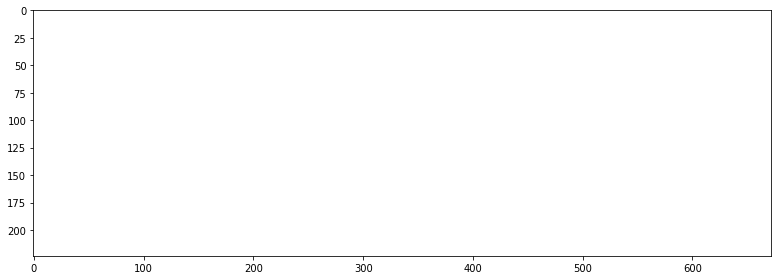

In [19]:
learner = EmmentalLearner()
grad, scan = learner.saliency(model, dataloaders)

saliency_maps = {
    'primary': {
        'scan': scan,
        'scan_grad': grad
    }
}
ani = show_saliency_maps(saliency_maps, name='primary')

In [20]:
ani
# loop_idx 304
# loop_idx 59

[2019-11-22 10:42:56,320][INFO] matplotlib.animation:1116 - Animation.save using <class 'matplotlib.animation.HTMLWriter'>


In [52]:
ani.save(osp.join(exp_dir, f"saliency2.gif"))

[2019-11-18 10:00:26,814][WARNING] matplotlib.animation:1108 - MovieWriter ffmpeg unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.
[2019-11-18 10:00:26,815][INFO] matplotlib.animation:1116 - Animation.save using <class 'matplotlib.animation.PillowWriter'>


In [63]:
loop_idxs = datasets['valid'].X_dict['loop_idxs']
datasets['valid'].split_df.iloc[304]

raw.tag_color                                                                     WT
raw.animal_number                                                               4547
raw.id                                                                        WT4547
raw.date_enrolled                                                         2015-07-08
raw.tus_score                                                                      3
raw.comments                                                                     NaN
raw.l5                                                                             2
raw.l6                                                                             1
raw.l7                                                                             1
raw.lv                                                                             3
raw.r4                                                                             1
raw.r5                                                           

In [64]:
datasets['valid'].split_df.iloc[59]

raw.tag_color                                                                     TQ
raw.animal_number                                                               4042
raw.id                                                                        TQ4042
raw.date_enrolled                                                         2015-06-10
raw.tus_score                                                                      3
raw.comments                                                                     NaN
raw.l5                                                                             2
raw.l6                                                                             2
raw.l7                                                                             1
raw.lv                                                                             3
raw.r4                                                                             3
raw.r5                                                           